<h1>Find me a new place to live!</h1>

<h2>Introduction</h2>

<h3>Problem</h3>

The United States is vast, and most people will never visit wide swaths of it. How can we be sure we’ve considered all the possible places that might be good fits for us to live, if a user doesn't even know about all the quaint towns in Montana that could be similar to his quaint town in Massachusetts? Or the mid-sized cities in the Midwest that would be a better fit for a heat-hater than the mid-sized city in the Deep South she currently inhabits?

I love to click around on Zillow or Redfin and imagine living in a totally different part of my country, but sometimes it can be hard to know where to start. I'd like a recommendation engine to be able to show me similar places I might not have thought of off the top of my head.

<h3>Strategy</h3>

One possible solution, using unsupervised learning methods, is to cluster counties in the U.S. that have similar * vibes * , even if they're not geographically close to each other. 

Ideally, it would be great to allow a user to input a budget and see either a sorted list of best-match areas or some random recommendations. 

Let's get started …

<h2>1. The Data Sources</h2>

In order to compare vibes of different areas, we'll need some information about them. 

<h3>Quality of Life Measures</h3>

The most important dataset we'll use is a public-domain [Quality of Life compilation](https://www.kaggle.com/datasets/zacvaughan/cityzipcountyfips-quality-of-life/data) by Zac Vaughan, via Kaggle. It combines data from various U.S. government agencies (the Census, EPA, USDA, Department of Education, etc.) as well as other good-quality data sources (UCSB's election results database, the Trust for Public Land, the Economic Policy Institute, etc.) to compile various information about U.S. counties. 

<h3>Housing Prices</h3>

Budget may be the most important consideration folks take into account when deciding where to live. I used a [dataset](https://public.tableau.com/app/profile/national.association.of.realtors/viz/Medianhomepricesbycounty-Q12024/Payment-County-Q12024) of median home prices and mortgage payment values by the National Association of Realtors. The advantages of this source were that it's quite complete (just over 3,100 counties represented) and recent (data as of Q1 2024). The disadvantages were that it was presented as a PDF, with no database version available to download(!!), so it took some massaging to be able to work with it.

<h3>Political Lean</h3>

Spoiler alert: I was excited to see that the Quality of Life data I downloaded included political information, but as you'll see, in the data cleaning and exploratory phase I realized it was only organized at the state level. I wanted to be particular about county-level data for political lean, because (unlike some other state-level variables in the Quality of Life dataset, like air quality, that are more generalizable to an entire state) there can be considerable political diversity within a state. I didn't want to let the political lean feature go, because it's an important factor in the vibe of a place! So after debating it a bit, I brought in [2020 vote data](https://doi.org/10.7910/DVN/VOQCHQ) from the MIT Election Data and Science Lab, 2018, "County Presidential Election Returns 2000-2020".

We'll start by importing some helpful libraries, as well as our three data sets.

In [508]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import time
from sklearn.model_selection import train_test_split
from scipy.sparse import coo_matrix, csr_matrix
from scipy.spatial.distance import jaccard, cosine

quality = pd.read_csv("QOL.csv")
housing = pd.read_csv("home-prices.csv")

<h2>2. Cleaning and Merging the Data</h2>

<h3>Quality of Life</h3>

Let's start with the Quality of Life data. First, we'll explore.

In [509]:
quality.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3134 entries, 0 to 3133
Data columns (total 34 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   countyhelper             3134 non-null   object 
 1   LSTATE                   3134 non-null   object 
 2   NMCNTY                   3134 non-null   object 
 3   FIPS                     3134 non-null   int64  
 4   LZIP                     3134 non-null   int64  
 5   ULOCALE                  3134 non-null   object 
 6   Overall Rank             0 non-null      float64
 7   2022 Population          3134 non-null   object 
 8   2016 Crime Rate          3134 non-null   object 
 9   Unemployment             3134 non-null   object 
 10  2020PopulrVoteParty      3134 non-null   object 
 11  2020 PopulrMajor%        3134 non-null   object 
 12  AQI%Good                 3134 non-null   object 
 13  WaterQualityVPV          3134 non-null   int64  
 14  ParkScore2023 Rank      

Great: We have about 26 columns that might be of interest, plus 5 identifier columns and one curious totally null column that we'll drop (maybe that one's a work in progress for the owner of the dataset).

I'm going to start by dropping the null column, plus columns 20-30 – these are granular cuts at cost of living for households of different sizes (e.g., 2p4c = two people, four children), which is too in the weeds for our purposes. I'm also going to cut columns 14 and 15 (park score 2023 and percent city park coverage) because I know from early data exploration that these are mostly empty. We'll leave the other two park scores (national park count and percent state park coverage). We'll drop LZIP, too, because we're not using ZIP Code-level analysis here, and the 'countyhelper' column, which just combines state and county; we're going to merge on both columns, so we don't need it.

In [510]:
quality = quality.drop(['countyhelper', 'LZIP', 'Overall Rank', 'ParkScore2023 Rank', '%CvgCityPark', 
                        'AVG C2I', '1p0c', '1p1c', '1p2c', '1p3c', '1p4c', '2p0c', '2p1c', 
                        '2p2c', '2p3c', '2p4c'], axis=1)

In [511]:
quality.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3134 entries, 0 to 3133
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   LSTATE                   3134 non-null   object
 1   NMCNTY                   3134 non-null   object
 2   FIPS                     3134 non-null   int64 
 3   ULOCALE                  3134 non-null   object
 4   2022 Population          3134 non-null   object
 5   2016 Crime Rate          3134 non-null   object
 6   Unemployment             3134 non-null   object
 7   2020PopulrVoteParty      3134 non-null   object
 8   2020 PopulrMajor%        3134 non-null   object
 9   AQI%Good                 3134 non-null   object
 10  WaterQualityVPV          3134 non-null   int64 
 11  NtnlPrkCnt               3134 non-null   int64 
 12  %CvgStatePark            3134 non-null   object
 13  Cost of Living           3134 non-null   object
 14  2022 Median Income       3134 non-null  

Looking good! One more thing: This has "2020PopulrVoteParty" (just D or R for whether the Democrat or Republican won the 2020 preisdential election) and "2020 PopulrMajor%" (the percentage of votes earned by the winner). I'd like to be able to combine these columns and sort them into heavily Democratic, lightly Democratic, tossup, lightly Republican or heavily Republican counties. Let's have a look at the range of values in the column. They're stored as strings, so we'll have to start by converting to decimal notation.

In [512]:
quality['vote_percents'] = quality['2020 PopulrMajor%'].astype(str).str.replace('%', '', regex=False)
quality['vote_percents'] = pd.to_numeric(quality['vote_percents']) / 100

vote_shares = quality['vote_percents'].describe(percentiles=[.25, .5, .75])

print(quality['vote_percents'].value_counts())

vote_percents
0.5206    253
0.4950    159
0.5411    133
0.6209    120
0.5680    115
0.5309    115
0.5621    105
0.5754    101
0.4859    100
0.6066     95
0.5851     93
0.5702     92
0.5327     88
0.5240     87
0.5062     83
0.5760     81
0.6537     77
0.6240     75
0.4945     72
0.5001     67
0.6203     67
0.5122     67
0.6177     65
0.5540     64
0.5846     63
0.6086     62
0.6348     58
0.5692     56
0.6863     55
0.6511     53
0.5511     46
0.6384     44
0.5797     39
0.5645     36
0.5429     32
0.5813     29
0.5283     28
0.6536     24
0.6994     23
0.5733     21
0.5006     17
0.4936     15
0.6560     14
0.6609     14
0.5271     10
0.5924      8
0.5939      5
0.6373      4
0.5878      3
0.9215      1
Name: count, dtype: int64


Oh, no! Looks like there are only 50 unique values — meaning this political data is by state, not by county. Let's drop it — we don't want to generalize that much.

In [513]:
quality = quality.drop(['2020 PopulrMajor%', '2020PopulrVoteParty', 'vote_percents'], axis=1)

In [514]:
quality.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3134 entries, 0 to 3133
Data columns (total 16 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   LSTATE                   3134 non-null   object
 1   NMCNTY                   3134 non-null   object
 2   FIPS                     3134 non-null   int64 
 3   ULOCALE                  3134 non-null   object
 4   2022 Population          3134 non-null   object
 5   2016 Crime Rate          3134 non-null   object
 6   Unemployment             3134 non-null   object
 7   AQI%Good                 3134 non-null   object
 8   WaterQualityVPV          3134 non-null   int64 
 9   NtnlPrkCnt               3134 non-null   int64 
 10  %CvgStatePark            3134 non-null   object
 11  Cost of Living           3134 non-null   object
 12  2022 Median Income       3134 non-null   object
 13  Stu:Tea Rank             3134 non-null   int64 
 14  Diversity Rank (Race)    3134 non-null  

But political data is pretty appealing to have for this project. I know of a dataset of 2020 votes by county I've used previously (see methodology [here](https://github.com/alexsymonds/covid-votes)), which I know is usable. I'll pipe that in here.

<h3>Unexpected Extra Dataset: 2020 Votes</h3>

In [515]:
votes = pd.read_csv("votes-2020.csv")

votes.head()

,year,state,state_po,county_name,county_fips,office,candidate,party,candidatevotes,totalvotes,version,mode
0,2020,ALABAMA,AL,AUTAUGA,1001.0,US PRESIDENT,JOSEPH R BIDEN JR,DEMOCRAT,7503,27770,20220315,TOTAL
1,2020,ALABAMA,AL,AUTAUGA,1001.0,US PRESIDENT,OTHER,OTHER,429,27770,20220315,TOTAL
2,2020,ALABAMA,AL,AUTAUGA,1001.0,US PRESIDENT,DONALD J TRUMP,REPUBLICAN,19838,27770,20220315,TOTAL
3,2020,ALABAMA,AL,BALDWIN,1003.0,US PRESIDENT,JOSEPH R BIDEN JR,DEMOCRAT,24578,109679,20220315,TOTAL
4,2020,ALABAMA,AL,BALDWIN,1003.0,US PRESIDENT,OTHER,OTHER,1557,109679,20220315,TOTAL


In [516]:
print(votes.nunique())

year                 1
state               51
state_po            51
county_name       1865
county_fips       3154
office               1
candidate            4
party                5
candidatevotes    6751
totalvotes        3052
version              1
mode                16
dtype: int64


We can drop a few of these right off the bat — the year will be 2020 and office will be president for all these, and since our other data sources use the PO codes for states we can drop the full state names. We can also drop version (the date the data was updated, same for all rows), and mode (this is type of vote, e.g., total, mail-in, etc., and will be rolled up when we roll these stacked rows up into a single row for each county). Let's also see the unique values for candidates.

In [517]:
votes = votes.drop(['year', 'state', 'office', 'version', 'mode'], axis = 1)
print(votes['candidate'].unique())
votes.info()

['JOSEPH R BIDEN JR' 'OTHER' 'DONALD J TRUMP' 'JO JORGENSEN']
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22093 entries, 0 to 22092
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   state_po        22093 non-null  object 
 1   county_name     22093 non-null  object 
 2   county_fips     22089 non-null  float64
 3   candidate       22093 non-null  object 
 4   party           22093 non-null  object 
 5   candidatevotes  22093 non-null  int64  
 6   totalvotes      22093 non-null  int64  
dtypes: float64(1), int64(2), object(4)
memory usage: 1.2+ MB


So far, so good. Next, we'll want to roll up the rows (currently separated into an individual row for each candidate/party) into a single row for each county, with columns for the candidates.

In [518]:
votes['trump'] = votes['candidatevotes'][votes['candidate']=='DONALD J TRUMP']
votes['biden'] = votes['candidatevotes'][votes['candidate']=='JOSEPH R BIDEN JR']
votes['other'] = votes['candidatevotes'][votes['candidate']=='OTHER']
votes['jorgensen'] = votes['candidatevotes'][votes['candidate']=='JO JORGENSEN']
votes.head()

,state_po,county_name,county_fips,candidate,party,candidatevotes,totalvotes,trump,biden,other,jorgensen
0,AL,AUTAUGA,1001.0,JOSEPH R BIDEN JR,DEMOCRAT,7503,27770,NaN,7503.0,NaN,NaN
1,AL,AUTAUGA,1001.0,OTHER,OTHER,429,27770,NaN,NaN,429.0,NaN
2,AL,AUTAUGA,1001.0,DONALD J TRUMP,REPUBLICAN,19838,27770,19838.0,NaN,NaN,NaN
3,AL,BALDWIN,1003.0,JOSEPH R BIDEN JR,DEMOCRAT,24578,109679,NaN,24578.0,NaN,NaN
4,AL,BALDWIN,1003.0,OTHER,OTHER,1557,109679,NaN,NaN,1557.0,NaN


In [519]:
votes = votes.groupby(['state_po', 'county_name', 'county_fips']).agg({
    'totalvotes': 'first',
    'trump': 'sum', #aggregates to return the first non-NaN value
    'biden': 'sum',
    'other': 'sum', #aggregates to return sum of non-NaN values (because some may have had 'other' for multiple third parties)
    'jorgensen': 'sum'
}).reset_index()

In [520]:
print(votes)

     state_po  county_name  county_fips  totalvotes    trump   biden  other  \
0          AK   DISTRICT 1       2001.0        7314   3511.0  3477.0  110.0   
1          AK  DISTRICT 10       2010.0       11205   8081.0  2727.0  111.0   
2          AK  DISTRICT 11       2011.0       10628   7096.0  3130.0  133.0   
3          AK  DISTRICT 12       2012.0       11238   7893.0  2957.0  100.0   
4          AK  DISTRICT 13       2013.0        7713   4652.0  2666.0   87.0   
...       ...          ...          ...         ...      ...     ...    ...   
3149       WY   SWEETWATER      56037.0       16698  12229.0  3823.0  296.0   
3150       WY        TETON      56039.0       14787   4341.0  9848.0  343.0   
3151       WY        UINTA      56041.0        9459   7496.0  1591.0  200.0   
3152       WY     WASHAKIE      56043.0        4032   3245.0   651.0   71.0   
3153       WY       WESTON      56045.0        3560   3107.0   360.0   47.0   

      jorgensen  
0         216.0  
1         286.0

Great! Let's make a new column for political lean. We can subtract total Biden votes from total Trump votes and divide by total votes to get margins of victory. Large negative values will indicate dark-blue (highly Democratic) areas, small negative values will light-blue areas, small positive values will indicate light-red places and large positive values will indicate dark-red places. We can do a quick sanity check on how many total counties end up with a positive or negative value and compare this to the [Brookings Institute analysis](https://www.brookings.edu/articles/a-demographic-contrast-biden-won-551-counties-home-to-67-million-more-americans-than-trumps-2588-counties/) that found 2,588 counties went to Trump versus 551 to Biden.

In [521]:
votes['political_lean'] = ((votes['trump'] - votes['biden']) / votes['totalvotes'])

print(votes['political_lean'].describe())

trump_counties = (votes['political_lean'] > 0).sum()
biden_counties = (votes['political_lean'] < 0).sum()
print(f"Trump counties: {trump_counties}, Biden counties: {biden_counties}")

count    3154.000000
mean        0.313498
std         0.322054
min        -0.867524
25%         0.128455
50%         0.379866
75%         0.564511
max         0.930909
Name: political_lean, dtype: float64
Trump counties: 2596, Biden counties: 558


Very similar total figures — we can feel comfortable with this new variable. To make the data more compact before merge, let's lose the raw vote totals and rename the FIPS variable.

In [522]:
votes = votes.drop(['totalvotes', 'trump', 'biden', 'other', 'jorgensen'], axis=1)
votes = votes.rename(columns={'county_fips': 'FIPS'})
print(votes)

     state_po  county_name     FIPS  political_lean
0          AK   DISTRICT 1   2001.0        0.004649
1          AK  DISTRICT 10   2010.0        0.477822
2          AK  DISTRICT 11   2011.0        0.373165
3          AK  DISTRICT 12   2012.0        0.439224
4          AK  DISTRICT 13   2013.0        0.257487
...       ...          ...      ...             ...
3149       WY   SWEETWATER  56037.0        0.503414
3150       WY        TETON  56039.0       -0.372422
3151       WY        UINTA  56041.0        0.624273
3152       WY     WASHAKIE  56043.0        0.643353
3153       WY       WESTON  56045.0        0.771629

[3154 rows x 4 columns]


Great! Now this data is ready to merge.

<h3>Housing Prices</h3>

Moving on to the housing prices dataset. N.B.: I did some initial data cleaning on this dataset that is not represented here (tedious artifacts stemming from having had to convert it from a PDF file).


In [523]:
housing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3110 entries, 0 to 3109
Data columns (total 8 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   State                      3110 non-null   object 
 1   County Name                3110 non-null   object 
 2   Median Home Price Q1 2024  3110 non-null   object 
 3   Monthly Payment Q1
2024    3110 non-null   object 
 4   Monthly Payment Q1
2023    3058 non-null   object 
 5   Unnamed: 5                 1 non-null      object 
 6   Unnamed: 6                 0 non-null      float64
 7   Unnamed: 7                 154 non-null    object 
dtypes: float64(1), object(7)
memory usage: 194.5+ KB


Worth noting here: In the housing prices dataset, three counties from Arkansas are missing. Delaware is  missing one. Florida is missing one. Indiana missing one. Massachusetts missing four. Michigan missing one. Mississippi missing two. New York missing one. Ohio missing two. South Dakota missing one. Texas missing two. Virginia missing two (including of its 38 independent cities often counted as counties). West Virginia missing three. That's a total of 24 missing counties, and the total number of counties in the dataset is 3,110. This squares with the 3,134 counties in our Quality of Life data, and we can live with dropping them once we see which ones don't match — it represents less than one percent of the total counties in the United States.

All we really care about here is state, county and median home price. We can lose the monthly payment and null columns.

In [524]:
housing = housing.iloc[:, [0, 1, 2]]

housing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3110 entries, 0 to 3109
Data columns (total 3 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   State                      3110 non-null   object
 1   County Name                3110 non-null   object
 2   Median Home Price Q1 2024  3110 non-null   object
dtypes: object(3)
memory usage: 73.0+ KB


<h3>Merging the Datasets</h3>

It's disappointing that the housing prices data doesn't include FIPS codes, which would be the easiest way to merge these two datasets. We'll have to do it on the state and county names, which is more prone to error. We can do a couple of things to try to mitigate that. 

First is to convert all the state names to the postal code versions (I did this already in the munging not shown). 

Second, we can strip trailing spaces from all four columns we're going to use (the state and county columns for both the housing data and the quality of life data).

And third, we can convert everything to uppercase just in case there's some capitalization weirdness (and to make it easier to merge with the vote data later).

Then we'll rename the quality dataframe's state and county columns so they match the housing data's. Then … we can try to perform a merge and see how we do!

In [525]:
quality['LSTATE'] = quality['LSTATE'].apply(lambda x: x.strip())
quality['NMCNTY'] = quality['NMCNTY'].apply(lambda x: x.strip())
quality['NMCNTY'] = quality['NMCNTY'].astype(str).str.upper()
quality = quality.rename(columns={'LSTATE': 'State', 'NMCNTY': 'County Name'}) 

housing['State'] = housing['State'].apply(lambda x: x.strip())
housing['County Name'] = housing['County Name'].apply(lambda x: x.strip())
housing['County Name'] = housing['County Name'].astype(str).str.upper()

print(quality.info())
print(housing.info())
print(quality.head())
print(housing.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3134 entries, 0 to 3133
Data columns (total 16 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   State                    3134 non-null   object
 1   County Name              3134 non-null   object
 2   FIPS                     3134 non-null   int64 
 3   ULOCALE                  3134 non-null   object
 4   2022 Population          3134 non-null   object
 5   2016 Crime Rate          3134 non-null   object
 6   Unemployment             3134 non-null   object
 7   AQI%Good                 3134 non-null   object
 8   WaterQualityVPV          3134 non-null   int64 
 9   NtnlPrkCnt               3134 non-null   int64 
 10  %CvgStatePark            3134 non-null   object
 11  Cost of Living           3134 non-null   object
 12  2022 Median Income       3134 non-null   object
 13  Stu:Tea Rank             3134 non-null   int64 
 14  Diversity Rank (Race)    3134 non-null  

In [526]:
first_data = pd.merge(quality, housing, on=['County Name', 'State'], how='outer')

In [527]:
first_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3140 entries, 0 to 3139
Data columns (total 17 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   State                      3140 non-null   object 
 1   County Name                3140 non-null   object 
 2   FIPS                       3134 non-null   float64
 3   ULOCALE                    3134 non-null   object 
 4   2022 Population            3134 non-null   object 
 5   2016 Crime Rate            3134 non-null   object 
 6   Unemployment               3134 non-null   object 
 7   AQI%Good                   3134 non-null   object 
 8   WaterQualityVPV            3134 non-null   float64
 9   NtnlPrkCnt                 3134 non-null   float64
 10  %CvgStatePark              3134 non-null   object 
 11  Cost of Living             3134 non-null   object 
 12  2022 Median Income         3134 non-null   object 
 13  Stu:Tea Rank               3134 non-null   float

It worked! Let's munge this before we merge the political lean set into it. Since we have the fewest values for Median Home Price, we'll drop the rows that don't have values for that column. But let's take a quick look at them to make sure we feel comfortable with that.

In [528]:
nan_homes = first_data[first_data[['Median Home Price Q1 2024']].isnull().any(axis=1)] 
nan_homes = nan_homes.sort_values('State')
print(nan_homes[['State', 'County Name']])

     State                        County Name
3102    AK          WRANGELL CITY AND BOROUGH
2618    AK               SKAGWAY MUNICIPALITY
2341    AK  PRINCE OF WALES-HYDER CENSUS AREA
2237    AK                 PETERSBURG BOROUGH
1536    AK               KUSILVAK CENSUS AREA
1288    AK          HOONAH-ANGOON CENSUS AREA
1398    AR                   JEFFERSON COUNTY
1659    AR                     LINCOLN COUNTY
565     AR                   CLEVELAND COUNTY
2736    DE                      SUSSEX COUNTY
929     FL                     FLAGLER COUNTY
1756    IN                     MADISON COUNTY
1169    MA                   HAMPSHIRE COUNTY
822     MA                       DUKES COUNTY
194     MA                   BERKSHIRE COUNTY
964     MA                    FRANKLIN COUNTY
2166    MI                      OTTAWA COUNTY
1031    MS                      GEORGE COUNTY
1374    MS                     JACKSON COUNTY
2806    NY                    TOMPKINS COUNTY
880     OH                        

Good news — this perfectly matches the counts for counties we knew to be missing from the housing prices data, plus six stray Alaskan counties, all of which are small. (I can say from previous projects working with county-level data that this was to be expected.) I feel comfortable dropping all of these rows.

In [529]:
first_data.drop(nan_homes.index, inplace=True) 

In [530]:
first_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3110 entries, 0 to 3139
Data columns (total 17 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   State                      3110 non-null   object 
 1   County Name                3110 non-null   object 
 2   FIPS                       3104 non-null   float64
 3   ULOCALE                    3104 non-null   object 
 4   2022 Population            3104 non-null   object 
 5   2016 Crime Rate            3104 non-null   object 
 6   Unemployment               3104 non-null   object 
 7   AQI%Good                   3104 non-null   object 
 8   WaterQualityVPV            3104 non-null   float64
 9   NtnlPrkCnt                 3104 non-null   float64
 10  %CvgStatePark              3104 non-null   object 
 11  Cost of Living             3104 non-null   object 
 12  2022 Median Income         3104 non-null   object 
 13  Stu:Tea Rank               3104 non-null   float64
 1

Let's figure out what those six counties are that appear in the State/County Name/Home Price columns but not the Quality of Life columns.

In [531]:
nan_quality = first_data[first_data[['FIPS']].isnull().any(axis=1)] 
print(nan_quality)


     State       County Name  FIPS ULOCALE 2022 Population 2016 Crime Rate  \
306     SD    BUFFALO COUNTY   NaN     NaN             NaN             NaN   
817     NM   DOÑA ANA COUNTY   NaN     NaN             NaN             NaN   
1356    MS  ISSAQUENA COUNTY   NaN     NaN             NaN             NaN   
1590    IL    LASALLE COUNTY   NaN     NaN             NaN             NaN   
1591    LA    LASALLE PARISH   NaN     NaN             NaN             NaN   
1884    SD    MELETTE COUNTY   NaN     NaN             NaN             NaN   

     Unemployment AQI%Good  WaterQualityVPV  NtnlPrkCnt %CvgStatePark  \
306           NaN      NaN              NaN         NaN           NaN   
817           NaN      NaN              NaN         NaN           NaN   
1356          NaN      NaN              NaN         NaN           NaN   
1590          NaN      NaN              NaN         NaN           NaN   
1591          NaN      NaN              NaN         NaN           NaN   
1884          N

Looks like a few small counties that don't appear in the Quality of Life data. I think it's okay to lose them.

In [532]:
first_data.drop(nan_quality.index, inplace=True) 

In [533]:
first_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3104 entries, 0 to 3139
Data columns (total 17 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   State                      3104 non-null   object 
 1   County Name                3104 non-null   object 
 2   FIPS                       3104 non-null   float64
 3   ULOCALE                    3104 non-null   object 
 4   2022 Population            3104 non-null   object 
 5   2016 Crime Rate            3104 non-null   object 
 6   Unemployment               3104 non-null   object 
 7   AQI%Good                   3104 non-null   object 
 8   WaterQualityVPV            3104 non-null   float64
 9   NtnlPrkCnt                 3104 non-null   float64
 10  %CvgStatePark              3104 non-null   object 
 11  Cost of Living             3104 non-null   object 
 12  2022 Median Income         3104 non-null   object 
 13  Stu:Tea Rank               3104 non-null   float64
 1

Now let's merge the other set — political lean. Thankfully, since we still have a FIPS code column preserved from the Quality of Life data and there's a FIPS code column in the vote data too, we can merge on it. This is generally a bit easier than trying to use county and state strings. But we'll preserve both sets of county/state strings for now to help us with any troubleshooting we may need to do after the merge.

In [534]:
data = pd.merge(first_data, votes, on=['FIPS'], how='outer', indicator=True)
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3173 entries, 0 to 3172
Data columns (total 21 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   State                      3104 non-null   object  
 1   County Name                3104 non-null   object  
 2   FIPS                       3173 non-null   float64 
 3   ULOCALE                    3104 non-null   object  
 4   2022 Population            3104 non-null   object  
 5   2016 Crime Rate            3104 non-null   object  
 6   Unemployment               3104 non-null   object  
 7   AQI%Good                   3104 non-null   object  
 8   WaterQualityVPV            3104 non-null   float64 
 9   NtnlPrkCnt                 3104 non-null   float64 
 10  %CvgStatePark              3104 non-null   object  
 11  Cost of Living             3104 non-null   object  
 12  2022 Median Income         3104 non-null   object  
 13  Stu:Tea Rank               3104 n

Okay! We did it. Let's keep cleaning and look at the rows that occur only in the political set and only in the quality of life/housing prices set.

In [535]:
df1_only = data[data['_merge'] == 'left_only']

df2_only = data[data['_merge'] == 'right_only']

print("Rows only in df1:\n", df1_only[['FIPS', 'County Name', 'State', 'county_name', 'state_po']])
print("\nRows only in df2:\n", df2_only[['FIPS', 'County Name', 'State', 'county_name', 'state_po']])

Rows only in df1:
        FIPS                      County Name State county_name state_po
107  2050.0               BETHEL CENSUS AREA    AK         NaN      NaN
108  2060.0              BRISTOL BAY BOROUGH    AK         NaN      NaN
109  2068.0                   DENALI BOROUGH    AK         NaN      NaN
110  2070.0           DILLINGHAM CENSUS AREA    AK         NaN      NaN
111  2090.0     FAIRBANKS NORTH STAR BOROUGH    AK         NaN      NaN
113  2100.0                   HAINES BOROUGH    AK         NaN      NaN
114  2110.0          JUNEAU CITY AND BOROUGH    AK         NaN      NaN
115  2122.0          KENAI PENINSULA BOROUGH    AK         NaN      NaN
116  2130.0        KETCHIKAN GATEWAY BOROUGH    AK         NaN      NaN
117  2150.0            KODIAK ISLAND BOROUGH    AK         NaN      NaN
118  2164.0       LAKE AND PENINSULA BOROUGH    AK         NaN      NaN
119  2170.0        MATANUSKA-SUSITNA BOROUGH    AK         NaN      NaN
120  2180.0                 NOME CENSUS AREA 

Just as I suspected: lots of the pesky Alaska counties that are notoriously hard to gather data on, and a few odds and ends elsewhere. I feel fine losing these.

In [536]:
data.drop(df1_only.index, inplace=True) 
data.drop(df2_only.index, inplace=True) 

In [537]:
print(data.info())

<class 'pandas.core.frame.DataFrame'>
Index: 3085 entries, 0 to 3171
Data columns (total 21 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   State                      3085 non-null   object  
 1   County Name                3085 non-null   object  
 2   FIPS                       3085 non-null   float64 
 3   ULOCALE                    3085 non-null   object  
 4   2022 Population            3085 non-null   object  
 5   2016 Crime Rate            3085 non-null   object  
 6   Unemployment               3085 non-null   object  
 7   AQI%Good                   3085 non-null   object  
 8   WaterQualityVPV            3085 non-null   float64 
 9   NtnlPrkCnt                 3085 non-null   float64 
 10  %CvgStatePark              3085 non-null   object  
 11  Cost of Living             3085 non-null   object  
 12  2022 Median Income         3085 non-null   object  
 13  Stu:Tea Rank               3085 non-nu

Okay, not bad! 

One last sanity check. Do all the county names match in each column? I know from earlier exploration that County Name has the word "county" while county_name does not, so we can just match on the first six characters of each string.

In [538]:
non_matching_indices = data.index[data['County Name'].str[:4] != data['county_name'].str[:4]]
print(data.loc[non_matching_indices])

     State                 County Name     FIPS            ULOCALE  \
40      AL                  LEE COUNTY   1081.0   41-Rural: Fringe   
79      AK      ALEUTIANS EAST BOROUGH   2013.0   43-Rural: Remote   
82      AK  ALEUTIANS WEST CENSUS AREA   2016.0   43-Rural: Remote   
86      AK      ANCHORAGE MUNICIPALITY   2020.0    31-Town: Fringe   
180     AR                  LEE COUNTY   5077.0   41-Rural: Fringe   
353     FL                  BAY COUNTY  12005.0     13-City: Small   
385     FL                  LEE COUNTY  12071.0     13-City: Small   
505     GA                  LEE COUNTY  13177.0    31-Town: Fringe   
581     ID                  ADA COUNTY  16001.0   21-Suburb: Large   
603     ID                  GEM COUNTY  16045.0   32-Town: Distant   
676     IL                  LEE COUNTY  17103.0  42-Rural: Distant   
764     IN                  JAY COUNTY  18075.0   41-Rural: Fringe   
865     IA                  IDA COUNTY  19093.0   43-Rural: Remote   
874     IA          

All righty, all good here! These are all either the Alaska outliers, three-character-name counties or "St." rendered in different ways.

Now that we're confident on that, we can lose the state and county variables from the political lean dataset, and lose the merge column.


In [539]:
data = data.drop(['state_po', 'county_name', '_merge'], axis=1)
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3085 entries, 0 to 3171
Data columns (total 18 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   State                      3085 non-null   object 
 1   County Name                3085 non-null   object 
 2   FIPS                       3085 non-null   float64
 3   ULOCALE                    3085 non-null   object 
 4   2022 Population            3085 non-null   object 
 5   2016 Crime Rate            3085 non-null   object 
 6   Unemployment               3085 non-null   object 
 7   AQI%Good                   3085 non-null   object 
 8   WaterQualityVPV            3085 non-null   float64
 9   NtnlPrkCnt                 3085 non-null   float64
 10  %CvgStatePark              3085 non-null   object 
 11  Cost of Living             3085 non-null   object 
 12  2022 Median Income         3085 non-null   object 
 13  Stu:Tea Rank               3085 non-null   float64
 1

One last data cleaning task: a bunch of the columns are in object type when we'd really like them to be floats so that we can do distance calculations with the clustering models. 

Before we convert to floats, we'll need to strip some of the columns of first or last characters, because they have either a percentage sign or a dollar sign attached. Start by printing the head to see which ones need this treatment.

In [540]:
data.head()

,State,County Name,FIPS,ULOCALE,2022 Population,2016 Crime Rate,Unemployment,AQI%Good,WaterQualityVPV,NtnlPrkCnt,%CvgStatePark,Cost of Living,2022 Median Income,Stu:Tea Rank,Diversity Rank (Race),Diversity Rank (Gender),Median Home Price Q1 2024,political_lean
0,AL,AUTAUGA COUNTY,1001.0,42-Rural: Distant,"59,759",32/1000,2.32%,80.94%,1.0,0.0,0.00%,"$79,873.47","$73,010.41",2072.0,2264.0,2093.0,"$211,320",0.444184
1,AL,BALDWIN COUNTY,1003.0,41-Rural: Fringe,"246,435",18/1000,2.41%,80.94%,-1.0,0.0,0.00%,"$79,155.41","$77,884.76",2667.0,2629.0,2725.0,"$349,670",0.537623
2,AL,BARBOUR COUNTY,1005.0,43-Rural: Remote,"24,706",32/1000,4.24%,80.94%,0.0,0.0,0.00%,"$65,185.13","$42,822.75",1338.0,1314.0,1473.0,"$122,340",0.076631
3,AL,BIBB COUNTY,1007.0,42-Rural: Distant,"22,005",10/1000,2.57%,80.94%,0.0,0.0,0.00%,"$73,362.21","$59,443.99",1683.0,1942.0,1353.0,"$139,800",0.577280
4,AL,BLOUNT COUNTY,1009.0,41-Rural: Fringe,"59,512",28/1000,2.28%,80.94%,0.0,0.0,0.00%,"$71,970.74","$63,966.13",2142.0,2352.0,2298.0,"$187,620",0.800022


Working from left to right: We can keep State and County Name as object type columns, and FIPS is already a float.

The rest of the columns need to be converted to floats, and they need various punctuation removed and other small transformations.

In [552]:
from fractions import Fraction

#0. ULOCALE needs to have everything stripped after the first two characters 
#(digits that refer to a categorical rural/urban variable that has 11 categories.)
data['ULOCALE'] = data['ULOCALE'].astype(str).str[:2].astype(float)

#1. 2022 Population needs to have the commas removed and be converted to floats.
data['2022 Population'] = data['2022 Population'].astype(str).replace(',', '').astype(float)

#2. 2016 Crime Rate needs to be converted to floats.
data['2016 Crime Rate'] = data['2016 Crime Rate'].astype(str).apply(lambda x: float(Fraction(x)) / 100 if x != 'None' else None)

#3. Unemployment needs to be converted from percentages to floats.
data['Unemployment'] = data['Unemployment'].astype(str).replace('%', '').astype(float) / 100

#4. AQI%Good needs to be converted from percentages to floats.
data['AQI%Good'] = data['AQI%Good'].astype(str).replace('%', '').astype(float) / 100

#5. %CvgStatePark needs to be converted from percentages to floats.
data['%CvgStatePark'] = data['%CvgStatePark'].astype(str).replace('%', '').astype(float) / 100

#6. Cost of Living needs to have the dollar signs and commas stripped, then be converted to floats.
data['Cost of Living'] = data['Cost of Living'].astype(str).replace({'$': '', ',': ''}, regex=True).astype(float)

#7. 2022 Median Income needs to have the dollar signs and commas stripped, then be converted to floats.
data['2022 Median Income'] = data['2022 Median Income'].astype(str).replace({'$': '', ',': ''}, regex=True).astype(float)

#8. Median Home Price Q1 2024 needs to have the dollar signs and commas stripped, then be converted to floats.
data['Median Home Price Q1 2024'] = data['Median Home Price Q1 2024'].replace({'$': '', ',': ''}, regex=True).astype(float)

In [553]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3085 entries, 0 to 3171
Data columns (total 18 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   State                      3085 non-null   object 
 1   County Name                3085 non-null   object 
 2   FIPS                       3085 non-null   float64
 3   ULOCALE                    3085 non-null   float64
 4   2022 Population            3085 non-null   float64
 5   2016 Crime Rate            3085 non-null   float64
 6   Unemployment               3085 non-null   float64
 7   AQI%Good                   3085 non-null   float64
 8   WaterQualityVPV            3085 non-null   float64
 9   NtnlPrkCnt                 3085 non-null   float64
 10  %CvgStatePark              3085 non-null   float64
 11  Cost of Living             3085 non-null   float64
 12  2022 Median Income         3085 non-null   float64
 13  Stu:Tea Rank               3085 non-null   float64
 1

Sweet. We're ready to roll.

<h3>3. Exploring the Data</h3>

Time for the fun part. We've ended up with 14 features here that cover lots of different kinds of demographic and other descriptive variables: population, crime rate, unemployment, air quality index (percent good for the state), water quality as defined by the USGS, National Park count, percentage of state covered by parkland, cost of living, median income, education rankings for student:teacher ratio and race and gender diversity, median home price and political lean.

I expect a lot of these variables to be at least lightly correlated. Bigger cities, for instance, tend to have more expensive cost of living, more racial diversity in schools, more expensive homes, more crime and more Democrats than smaller/rural areas. I'm guessing air and water quality are correlated too.

Let's check those assumptions by visualizing our features.

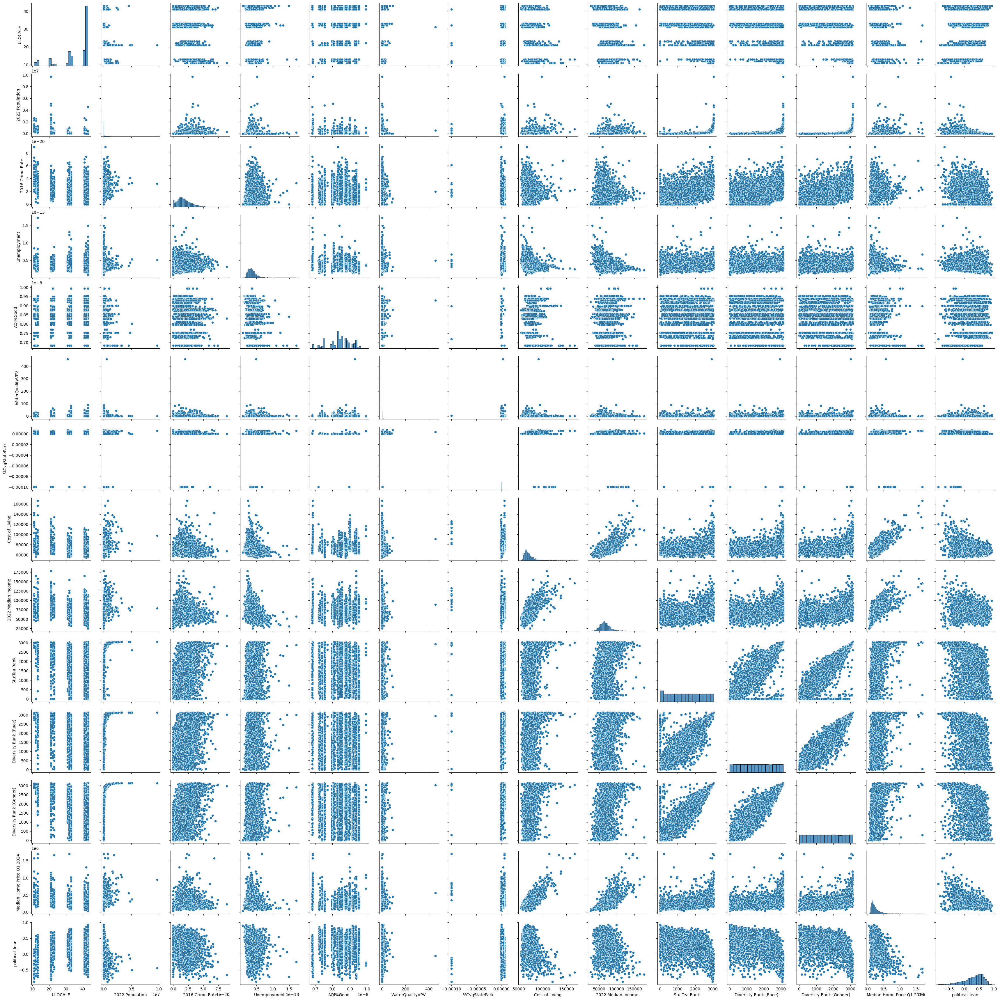

In [555]:
import matplotlib.pylab as plt
from sklearn import datasets
import seaborn as sns

sns.pairplot(data=data, vars=['ULOCALE', '2022 Population', '2016 Crime Rate', 'Unemployment', 'AQI%Good', 'WaterQualityVPV', 
                              '%CvgStatePark', 'Cost of Living', '2022 Median Income', 'Stu:Tea Rank', 'Diversity Rank (Race)',
                             'Diversity Rank (Gender)', 'Median Home Price Q1 2024', 'political_lean'])

It looks like a lot of our assumptions are borne out here. We can move on to modeling!

<h3>4. Analysis</h3>

I'm going to try several different clustering methods to try to arrive at around 15 clusters of American counties that have similar "vibes." (I've chosen 15 because of the [American Communities Project](https://app.americancommunities.org/?_gl=1%2an9fgng%2a_ga%2aMTE2ODU1NjA0My4xNzI3ODgzMTE5%2a_ga_72CXLLPW01%2aMTcyNzg4MzExOC4xLjEuMTcyNzg4MzMyMi4wLjAuMA..), a much more rigorous version of the kind of thing I'm attempting with this project, which ended up with 15 clusters.)

We'll need to separate the variables and do some feature scaling first.

<h4>First model: hierarchical clustering</h4>

In [556]:
from sklearn.cluster import AgglomerativeClustering, KMeans
import sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix, adjusted_rand_score, silhouette_score

locations = data[['State', 'County Name', 'FIPS']]

cluster_features = data[['ULOCALE', '2022 Population', '2016 Crime Rate', 'Unemployment', 'AQI%Good', 'WaterQualityVPV', 
                            '%CvgStatePark', 'Cost of Living', '2022 Median Income', 'Stu:Tea Rank', 'Diversity Rank (Race)',
                            'Diversity Rank (Gender)', 'Median Home Price Q1 2024', 'political_lean']]

scaler = StandardScaler()
scaled_features = scaler.fit_transform(cluster_features)

affinity_combinations = [('complete', 'manhattan'), ('complete', 'cosine'), ('average', 'manhattan'), ('average', 'cosine'),
                            ('single', 'manhattan'),('single', 'cosine'), ('ward', 'euclidean')]

for linkage, affinity in affinity_combinations:
    print(f"Linkage: {linkage}, Affinity: {affinity}")
    
    model=AgglomerativeClustering(linkage=linkage, metric=affinity, n_clusters=15)
    model.fit(scaled_features)
    data['Cluster'] = model.labels_
    score = silhouette_score(cluster_features, model.labels_)
    cluster_counts = data['Cluster'].value_counts()
    print("Silhouette score:", score, cluster_counts)

Linkage: complete, Affinity: manhattan
Silhouette score: -0.19086334456853937 Cluster
6     1364
13     634
1      493
0      268
4      176
14      52
2       39
10      16
8       15
9       10
3        8
5        7
11       1
12       1
7        1
Name: count, dtype: int64
Linkage: complete, Affinity: cosine
Silhouette score: -0.25009408336152594 Cluster
1     570
11    356
0     341
9     282
7     263
6     217
5     207
3     201
2     141
10    140
13    120
8     100
4      67
12     45
14     35
Name: count, dtype: int64
Linkage: average, Affinity: manhattan
Silhouette score: -0.4176795447630772 Cluster
2     3020
4       24
1       10
10       5
6        5
5        4
0        3
12       3
3        3
9        3
13       1
11       1
8        1
7        1
14       1
Name: count, dtype: int64
Linkage: average, Affinity: cosine
Silhouette score: -0.25178999422933485 Cluster
6     816
9     687
13    442
3     236
1     202
5     149
0     132
14    131
8     105
4      51
11     

Okay, great! We've learned a lot here. Some of the affinity/linkage options seem to work better than others — ideally, I'd like to have 15 clusters with similar numbers of counties in each one. I very much do not want to have any clusters with just a single county, because my ultimate goal is to be able to show users a list of counties similar to their own. Since we're concerned here with * vibes *, I'm less concerned about provable mathematical accuracy than with a good mix. Since all of the Manhattan distance methods end up with several clusters with just one county in them, I'm going to eliminate those. Ward/Euclidean also ends up with one single-county cluster and another single-digit one. 

I think complete/cosine is going to be our best option because even the smallest cluster has 35 counties in it. Average/cosine will be a runner-up, with the smallest cluster having 11 counties. And while none of the silhouette scores here are particularly good, these metric combinations are some of the least bad. Let's move on with complete/cosine and examine it a little closer.

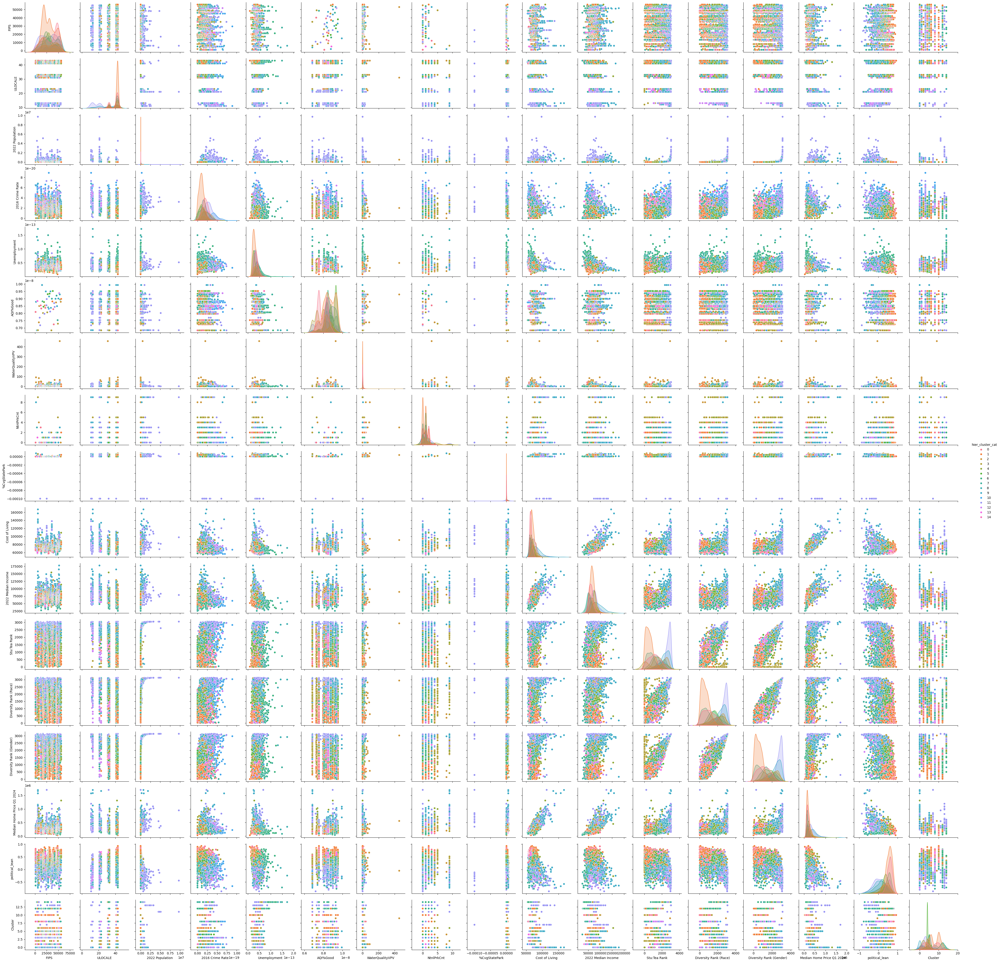

In [559]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


model=AgglomerativeClustering(linkage='complete', metric='cosine', n_clusters=15)
model.fit(scaled_features)
data['hier_cluster_cat'] = pd.Categorical(model.labels_)

sns.pairplot(data, hue='hier_cluster_cat')
plt.show()

Cool! Let's next try k-means clustering.

<h4>Second model: k-means clustering</h4>

In [560]:
kmeans = KMeans(n_clusters=15, init='k-means++', random_state=42)
k_labels = kmeans.fit_predict(cluster_features)
data['kmeans_cluster_cat'] = pd.Categorical(k_labels)

print(data['kmeans_cluster_cat'].value_counts())

kmeans_cluster_cat
3     1344
0      879
8      316
11     204
12     111
7       82
10      47
5       39
1       24
9       19
6       11
2        3
13       3
14       2
4        1
Name: count, dtype: int64


In this instance, balanced k-means is not the best strategy because the clusters aren't very balanced. I'm going to stick with hierarchical clustering with complete linkage and cosine distance metric. 

I'm curious to see what kinds of places this clustering system says are similar! Let's return the county values for a random selection of 5 counties for each value.

In [569]:
for i in range(0,15):
    value_to_filter = i
    random_rows = data[data['hier_cluster_cat'] == value_to_filter].sample(n=5, random_state=4242)
    print(f"Cluster: {i}, counties:\n {random_rows[['State', 'County Name']]}")

Cluster: 0, counties:
      State     County Name
576     GA    WORTH COUNTY
2775    TX    TERRY COUNTY
923     KS  BOURBON COUNTY
2710    TX   MARION COUNTY
2624    TX    ERATH COUNTY
Cluster: 1, counties:
      State        County Name
2855    VA  APPOMATTOX COUNTY
877     IA       LUCAS COUNTY
1706    NE       DAWES COUNTY
1568    MO       LEWIS COUNTY
2783    TX       UPTON COUNTY
Cluster: 2, counties:
      State        County Name
57      AL   ST. CLAIR COUNTY
41      AL   LIMESTONE COUNTY
1859    NY    ALLEGANY COUNTY
1338    MI  SHIAWASSEE COUNTY
2393    SD      BEADLE COUNTY
Cluster: 3, counties:
      State          County Name
922     KS        BARTON COUNTY
2223    OK  POTTAWATOMIE COUNTY
2659    TX     HENDERSON COUNTY
2713    TX     MATAGORDA COUNTY
1002    KS        SALINE COUNTY
Cluster: 4, counties:
      State         County Name
294     CO        EAGLE COUNTY
1894    NY      ORLEANS COUNTY
1947    NC         DARE COUNTY
969     KS  LEAVENWORTH COUNTY
3083    WI      

This is great — exactly what I was hoping for. We're getting a great mix of states for every cluster. Hopefully this will help inspire people's imaginations!

Let's see if some places that probably should live together do live together — for instance, Manhattan, Chicago and Los Angeles.

In [435]:
print(data[['State', 'hier_cluster_cat']][data['County Name'].isin(['NEW YORK COUNTY', 'COOK COUNTY', 'LOS ANGELES COUNTY'])])

     State hier_cluster_cat
235     CA               11
454     GA                7
640     IL               11
1359    MN                7
1888    NY               11


Great! The cities we're thinking of are all together in cluster 11.

<h3>5. Writing a Program</h3>

I want to be able to use my new clusters to let users find counties they might not know about that are similar to a county they do know about. 

I'd also like users to be able to add a budget and have the program take it into account. 

In [506]:
def new_place(data, county, state, budget, budgettype, ordering):
    if not county.isupper():
        county = county.upper()
    if not state.isupper() and len(state) == 2:
        print(f"Please enter a two-character postal code for the state field.")
        return
    if not isinstance(budget, (int, float)):
        print(f"Please enter your budget with no dollar signs or commas.")
        return
        
    # input county and state into data to find cluster
    cluster = data.loc[(data['County Name'] == county) & (data['State'] == state), 'hier_cluster_cat']

    if cluster.empty:
        print("No matching county/state found.")
        return

    cluster = cluster.values[0]

    #set upper and lower values against budget, to create a range
    upper_budget = budget * 1.2
    lower_budget = budget * 0.8
    
    # temporarily store all other counties in that cluster with a median home price close to budget
    # if budgettype is 'upper', include any county with median home price at most 20 percent higher than budget 
    # (even if it's much lower)
    if budgettype == 'upper':
        potentials = data[(data['hier_cluster_cat'] == cluster) & 
                           (data['Median Home Price Q1 2024'] <= (upper_budget))]
        
    # if budgettype is 'similar', constrain list of potentials to counties with median home prices +/- 20 percent of budget
    elif budgettype == 'similar':
        potentials = data[(data['hier_cluster_cat'] == cluster) & 
                           (data['Median Home Price Q1 2024'] >= (lower_budget)) &
                           (data['Median Home Price Q1 2024'] <= (upper_budget))]

    potentials = potentials.copy()
        
    # sort this list by closest values to budget
    potentials['Budget Difference'] = abs(potentials['Median Home Price Q1 2024'] - budget)
    potentials = potentials.sort_values(by='Budget Difference')
    
    # depending on whether user inputted "sorted" or "random" for ordering, return either 5 closest values in order 
    # or 5 random values from the larger list of clusters in price range
    if ordering == 'sorted':
        return_pots = potentials[['County Name', 'State', 'Median Home Price Q1 2024']].head(5)

    elif ordering == 'random':
        return_pots = potentials[['County Name', 'State', 'Median Home Price Q1 2024']].sample(n=5)

    # print a nice sentence
    pots_list = return_pots[['County Name', 'State']].values.tolist()
    print(f"You're looking for places similar to {county}, {state}. Have you considered these?: {pots_list}")
        
# here's where I live:
new_place(data, 'KINGS COUNTY', 'NY', 1000000, 'similar', 'random')

You're looking for places similar to KINGS COUNTY, NY. Have you considered these?: [['LOS ANGELES COUNTY', 'CA'], ['SUFFOLK COUNTY', 'MA'], ['SONOMA COUNTY', 'CA'], ['BOULDER COUNTY', 'CO'], ['NEW YORK COUNTY', 'NY']]


Hollywood, Boston, wine country, Manhattan, and … Boulder, Colorado, a city newly very near and dear to my heart!

I would be very happy to move to any of these places. I think we can call this a success!

<h3>6. Discussion and Conclusions</h3>

This project was a lot of fun to put together, and I think my model did a good job of what I set out to do: grouping counties in the United States that are similar across a large number of features, even if they are not close to each other geographically. My "new_place" program successfully outputs either a sorted list or random list of five new places for a person to consider that are similar to a county they've inputted, around a budget they've set.

This is still a fairly crude way of clustering American places, and there are a lot of ways I can think of to make this project better in the future. They include:

1. More granular data — for instance, ZIP code (about 41,000 in U.S.) rather than county (about 3,000) — would allow for more exact recommendations.
2. More exact schools data. The quality of life dataset I used has ranked data for diversity and student/teacher ratios; raw data is available but needs significant munging, which was outside the scope of this project.
3. Offer Zillow or Redfin links in the new_place output. This requires API access, which I didn't want to pay for, but maybe one of these companies would like to use this tool themselves. :)
4. Of course, the model would be a lot more powerful with some additional feature data. The quality of life dataset I used was a great start, but kind of a grab bag. It did not include, for example, data on racial demographics (beyond a very simple ranking of racial diversity in schools), age pyramids, walkability or natural features in each county. It would also be great to get some data about school quality beyond student/teacher ratios and diversity — test scores, for instance. Finally, in a dream scenario I would love to be able to include weather in a model like this! I spent about a day looking for good county-level sources of some basic metrics, like average monthly temperature and rainfall. But there were two huge obstacles: One, ironically many of NOAA's servers were offline due to Hurricane Helene; and two, weather data in the U.S. is generally tracked by station, rather than by county. It's theoretically possible to join those shapefiles. Outside the scope of a single-semester final project, but I certainly encourage anyone else to try.
5. It would be fun to add in some optional parameters to the new_places tool that allow users to specify that the model only return places with specific values or ranges in areas that are important to her (for example, Democratic counties or places with lots of parks or low student-teacher ratios).

Thank you for reading!